García Fernandez, Arnau

## Final project

I will be using the initial guide provided in the Campus. Notwithstanding, I will be adding some notes and comments with the aim of understand all the elements used in the assigment. Due my null background with `Scikit` and this kind of programming I will be doing some research about it during the assignment and I will be adding notes to make it easier for me to understand what I am doing. 

An Eigenfaces Session with python
==========
This session aims to demonstrate the use of scikit in python using an eigenfaces exercise. First will construct a class for storing the information of the chamber of representatives. Later we will import the image dataset, compute some descriptive statistics, perform an analysis of principal components, clustering analysis and finally will use a non-linear classifier to assess the gender from just the image of the representative. 

Diputado Class
-----
A diputado has a Name, Surnames, ID, Picture, Gender and Political Affiliation.

**What is a class in `Python`?**
In Python, a class is a kind of template for creating objects. It defines a set of attributes and methods that the objects created from the class will have. An object is an instance of a class. A class have different important components:
- **Attributes** are variables that belong to the class or its instances (objects). They represent the characteristics or properties of the objects. For example, a Person class might have attributes like name, age, and email.
- **Methods** are functions defined within a class. They perform actions or operations on the data associated with the class. For example, a Person class might have methods like introduce() or send_email().
- The **constructor method** (__init__()) is a special method that gets called when an object is created from the class. It is used to initialize the object's attributes with specific values.
- Within the class, the term **self** refers to the instance of the class itself. It is used to access and modify the attributes and methods of the class within its own scope.


In [1]:
%matplotlib inline 

#we will use matplotlib for recomendation of python warning messages

fileRoot="/Users/arnaugarcia/Desktop/Q1/bases de dades/python/assignment/Lab Database"

class Diputado(object):
    def __init__(self,ind,fileRoot):
        self.name=""
        self.surname=""
        self.ind=ind
        self.picfile=""
        self.party=""
        self.gender=""
        self.fileRoot=fileRoot
        self.ext="c.jpg" 
    def setName(self,name):
        self.name=name
    def setSurname(self,surname):
        self.surname=surname
    def setParty(self,party):
        self.party=party
    def setGender(self,gender):
        self.gender=gender
    def getName(self):
        return self.name
    def getSurname(self):
        return self.surname
    def getInd(self):
        return self.ind
    def getPicfile(self):
        return fileRoot + "/db/" + str(self.ind) + self.ext
    def getParty(self):
        return self.party
    def getGender(self):
        return self.gender
       

Parlament class
-----
Let's define a very simple Parlament object, where we store the diputados objects. From this class, we have to be able to get information from the parlament.

In [2]:
class Parlament(object):
    def __init__(self):
        self.elements=[]
        self.inds=[]
        self.ndips=0
    def add(self, diputado):
        self.elements.append(diputado)
        self.inds.append(diputado.getInd())
        self.ndips +=1
    def getInds(self):
        return [self.elements[i].getInd() for i in range(self.ndips)]
    def len(self):
        return len(self.elements)
    def __getitem__(self, key):
        if isinstance(key, slice):
            indices = key.indices(self.ndips)
            return [self[ii] for ii in xrange(*key.indices(self.len()))] 
        else:
            return self.elements[key]
    def getName(self,key):
        return self.elements[key].getName()
        

## Importing the data
Now we import the CSV where we have all the necessary data related with the diputados. We will extract all the information from the CSV and we will save it in the classes definded before.

In [3]:
import csv
with open('/Users/arnaugarcia/Desktop/Q1/bases de dades/python/assignment/Lab Database/index.csv','r', encoding="utf-8") as csvfile:
    r = csv.reader(csvfile, delimiter=';')
    r.__next__()
    p = Parlament()
    for row in r:
        n = Diputado(int(row[0]),"db/db/")
        n.setName(row[1].strip())
        n.setSurname(row[2].strip())
        n.setGender(row[3].strip())
        n.setParty(row[4].strip())
        p.add(n)


In [4]:
p.len()
p[99].getPicfile()

'/Users/arnaugarcia/Desktop/Q1/bases de dades/python/assignment/Lab Database/db/91c.jpg'

Here we see an example of how to plot the images and the attributes from the database. In this case we will take `idip=10`, it is, as a id for the diputado we will take $10$. Thus, we will show the attributes for the $10th$ diputado, she is María Teresa Fernández de la Vega:


'María Teresa|Fernández de la Vega Sanz|M'

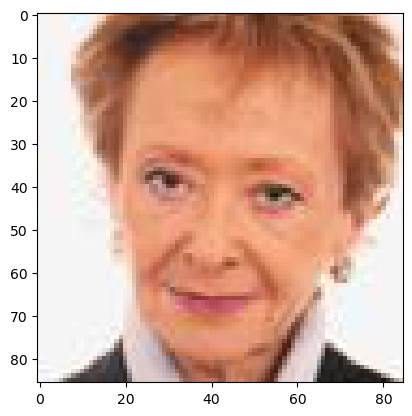

In [5]:
from scipy import ndimage,misc
import numpy as np
import matplotlib.pyplot as pl
#let idip be the identifier of the diputado
idip = 10
I = pl.imread(p[idip].getPicfile())
pl.imshow(I)
np.shape(I)
'|'.join([p[idip].getName(), p[idip].getSurname(), p[idip].getGender()])

In addition, we can plot the image of María Teresa in black and white addind the command `img.set_camp('gray')`.

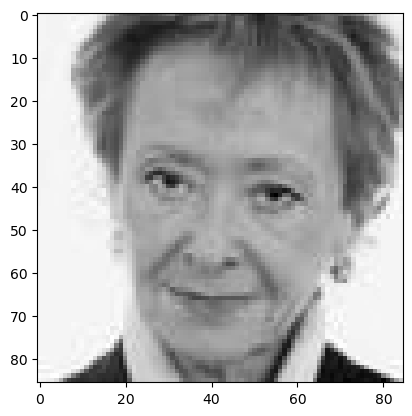

In [6]:
I = pl.imread(p[idip].getPicfile()).mean(axis=2)
img=pl.imshow(I)
img.set_cmap('gray')
Is=np.shape(I)


Here we see another form to plot the data stored in the image.

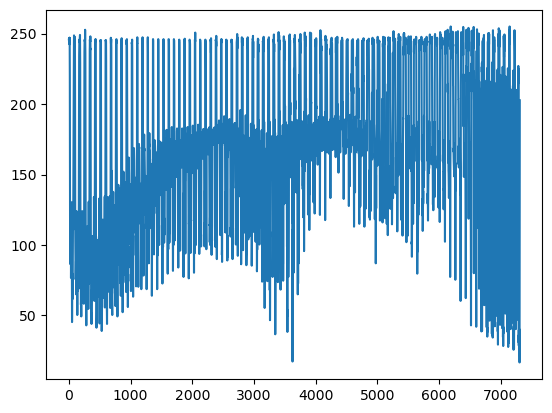

In [7]:
Iv = np.reshape(I,np.prod(Is))
pl.plot(Iv);

Here we stack all the images in a numpy array called `X`. In addition, we create two numpys arrays `Yg` and `Yp` where we will save the labels of gender (in `Yg`) and the party (in `Yp`) for each diputado.

In [8]:
X=np.array([ pl.imread(d.getPicfile()).mean(axis=2).ravel()
             for d in p])
np.shape(X)
Yg=np.array([ d.getGender() for d in p])
Yp=np.array([ d.getParty() for d in p])
Yp[0:5],Yg[0:5],np.shape(X)

(array(['GS', 'GS', 'GC-CiU', 'GP', 'GP'], dtype='<U10'),
 array(['H', 'M', 'H', 'H', 'H'], dtype='<U1'),
 (348, 7310))

Here we plot the numpy array of all the images, and then we obtain a "matrix" with all the images stacked in `X`.

<IPython.core.display.Javascript object>


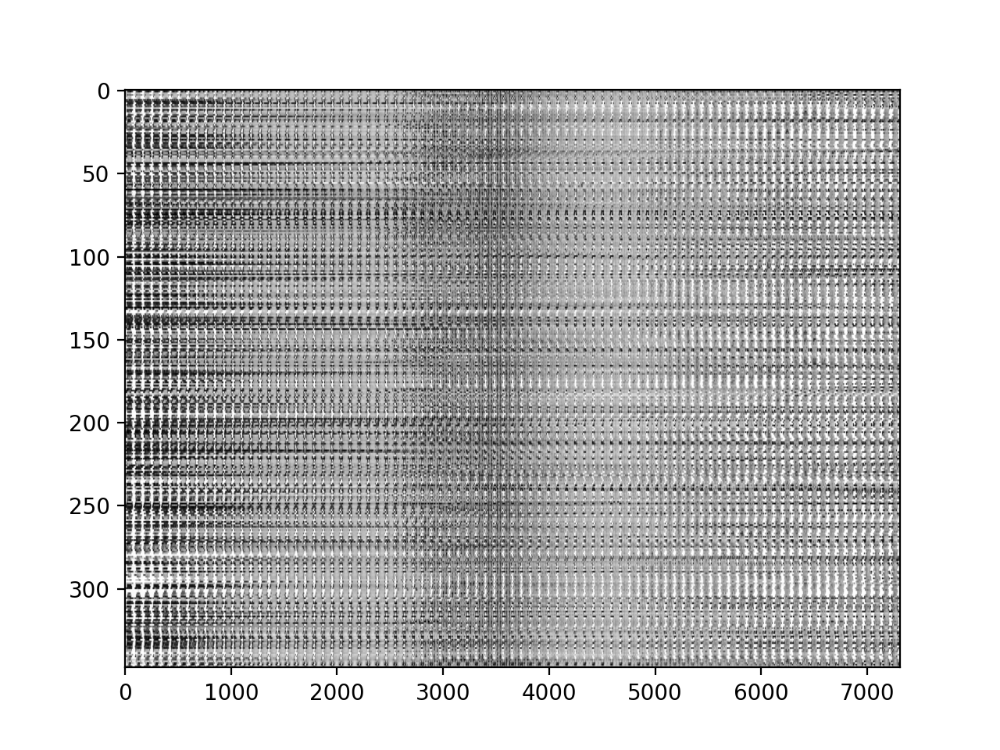

In [9]:
%matplotlib notebook 
pl.imshow(X,aspect='auto')
pl.set_cmap('gray')


## PROBLEMS

**Problem 1:** Look at the metadata file, which is the propotion of male/females? which is the most common male name? and female name? which is the size of the dataset? How many individuals we have for each political party?

We will use what we did with pandas for this problem. Then, firstly, we will read the CSV file with pandas in order to be able to work with it in pandas. 

In [13]:
import pandas as pd
df = pd.read_csv('/Users/arnaugarcia/Desktop/Q1/bases de dades/python/assignment/Lab Database/index.csv', 
                 encoding="utf-8", delimiter=';')
df.head(5)

,Num,Name,Surname,Gender,Party
0,321,Manuel,Marín González,H,GS
1,251,Carme,Chacón Piqueras,M,GS
2,132,Jordi,Vilajoana Rovira,H,GC-CiU
3,181,Gabriel,Cisneros Laborda,H,GP
4,154,Ignacio,Gil Lázaro,H,GP


In [14]:
df["Gender"].value_counts() #frequency table with respect of Gender

 H     223
 M     125
Name: Gender, dtype: int64

In the next cell we will remove the white spaces that our csv file has. We will use that all the variables of the data frame are character variables except the first one (which is te Num variable).

In [15]:
#We want to delete the white spaces that diffucult our tasks:
k=0
for l in df.columns:
    if(k):
        df[l] = df[l].str.strip()
    k=k+1

In [16]:
print("Proportion of male:", (sum(df["Gender"]=="H")/len(df))*100,"percent.\n")
print("Proportion of female:", (sum(df["Gender"]=="M")/len(df))*100, "percent.")

Proportion of male: 64.08045977011494 percent.

Proportion of female: 35.91954022988506 percent.


Using `value_counts(sort=True)` we can see a frequency table sorted decreasing, and then using this we can easily find the most common male name. Using the same we find the most comon female name.

In [17]:
df[df["Gender"]=="H"]["Name"].value_counts(sort=True)

José             7
Jordi            6
Antonio          6
Jesús            5
Francisco        5
                ..
Ińaki            1
Aitor            1
Pere             1
Carles           1
José Luis del    1
Name: Name, Length: 143, dtype: int64

In [18]:
df[df["Gender"]=="M"]["Name"].value_counts(sort=True)

Carmen       7
Pilar        3
Ana María    3
Elvira       2
Lourdes      2
            ..
Rosario      1
Eloísa       1
Meritxell    1
Manuela      1
Verónica     1
Name: Name, Length: 101, dtype: int64

We will return the size of the dataset in terms of number of rows and number of columns.

In [19]:
print("Number of rows=", df.shape[0], "Number of columns=", df.shape[1], 
      "Total entries=", df.shape[0]*df.shape[1])

Number of rows= 348 Number of columns= 5 Total entries= 1740


For know how many indviduals we have for each political party we will use again `value_counts()`.

In [20]:
#Observe that we also have white spaces in the variables names, we will remove it
df.columns

Index(['Num ', 'Name', 'Surname', 'Gender', 'Party '], dtype='object')

In [21]:
df.columns = df.columns.str.strip()

In [22]:
df.columns

Index(['Num', 'Name', 'Surname', 'Gender', 'Party'], dtype='object')

In [23]:
df["Party"].value_counts()

GS            164
GP            146
GC-CiU         10
GER-ERC         8
GV              7
GIV-IU-ICV      5
GMx             5
GCC             3
Name: Party, dtype: int64

**Problem 2:** Compute the mean representative and plot the image corresponding to the mean representative (dataset provided below).

In order to compute the mean diputado we only need to use the mean function form the `numpy` library (it is `np.mean`). Then, in order to plot this mean diputado we will be using similar code than the one provided in the guide, using `matplotlib` for plot. Notice that in the object `X` we have the array of all the $348$ images, and with the information of all these images. Then, when we do computations with this array, and then we want to plot the result, we should reshape the object. This is easy using `reshape()` from numpy, and taking into account that $86*85=7310$, which is what we desire (the shape of `X` is (348,7310)).

In [24]:
mean_diputado = np.mean(X, axis=0).reshape(86,85)

<IPython.core.display.Javascript object>


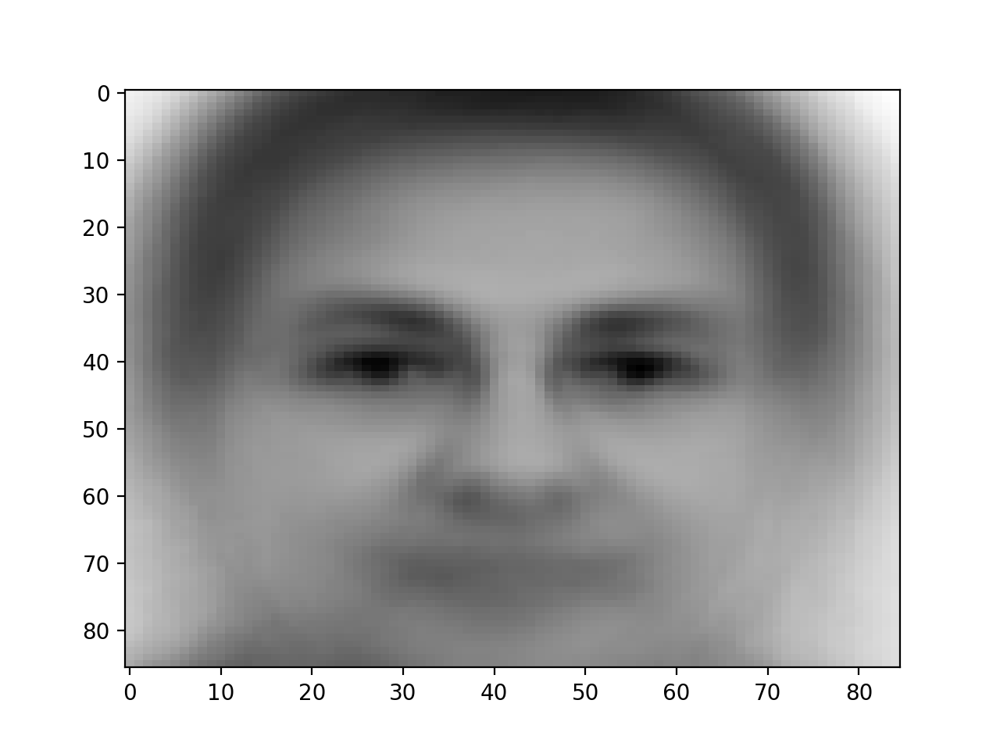

In [25]:
%matplotlib notebook

pl.imshow(mean_diputado, aspect='auto')
pl.set_cmap('gray')

**Problem 3:** Compute the standard deviation and plot the corresponding image.

We will be using the same arguments and a similar code than in the previous problem, but now we have to compute the standard deviation and with this purpose we will use `np.std()`.

In [26]:
sd_diputado = np.std(X, axis=0).reshape(86,85)

<IPython.core.display.Javascript object>


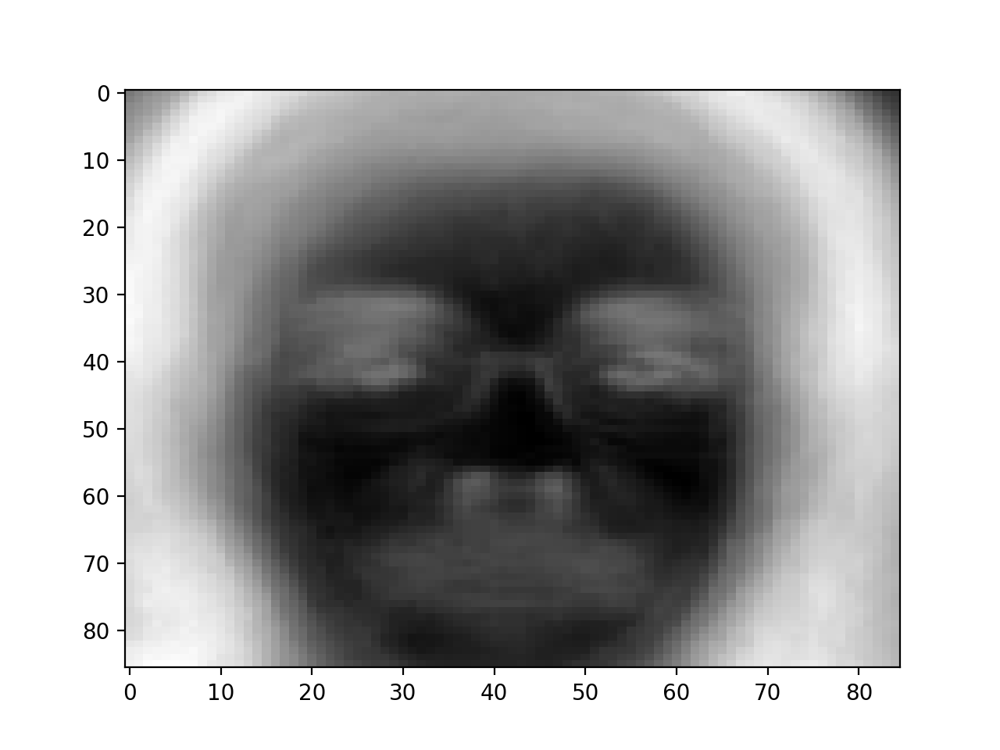

In [27]:
%matplotlib notebook

pl.imshow(sd_diputado, aspect='auto')
pl.set_cmap('gray')

**Problem 4:** Run a k-means clustering and split the representatives' data into 10 groups. Plot the full set of images for two groups of your choice.

In order to apply the kmeans algorithm we will import `KMeans` from `sklearn.cluster`. Usinf this function we will create an instancem and then we will use this instance for fit a kmean algorithm to our data, it is to $X$.

In [28]:
from sklearn.cluster import KMeans
#we create an instance of the object KMeans, using k=10
k=10
kmeans = KMeans(n_clusters=10)
#we fit the model
kmeans.fit(X)
centroids = kmeans.cluster_centers_
clusters = kmeans.labels_

/Users/arnaugarcia/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Observe that with this simple code we have applied the _kmeans_ algorithm to our set of images. In the clusters objects we have saved the correspondent cluster for each diputado. It is, `clusters` object is a numpy array that has ordered the cluster of each diputado, then the first component of the `clusters` object will be a number between $0$ and $k-1$ (remember that we are applying kmeans with $k$ groups) which is the group of clustering of which the diputado is.

<IPython.core.display.Javascript object>


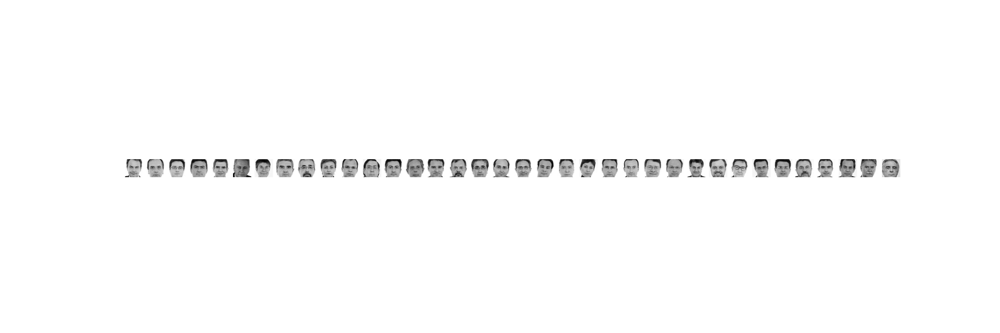

In [32]:
%matplotlib notebook
#we will select the groups 3 and 8. First que plot the group 3:
indices_group3 = np.where(clusters == 3)[0] 
fig, axes = pl.subplots(1, len(indices_group3), figsize=(15, 5))
j=0
for i in indices_group3:
    axes[j].imshow(X[i].reshape(86,85))
    axes[j].axis('off')
    j=j+1
pl.show()

<IPython.core.display.Javascript object>


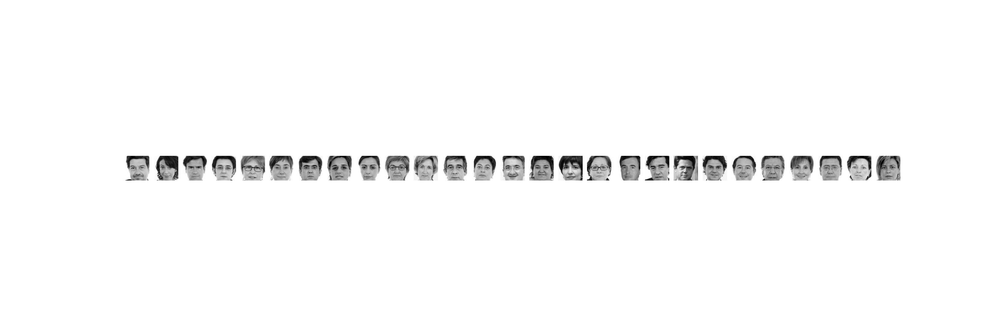

In [33]:
%matplotlib notebook
#we will select the groups 3 and 8. Now plot the group 8:
indices_group3 = np.where(clusters == 8)[0] 
fig, axes = pl.subplots(1, len(indices_group3), figsize=(15, 5))
j=0
for i in indices_group3:
    axes[j].imshow(X[i].reshape(86,85))
    axes[j].axis('off')
    j=j+1
pl.show()

**Problem 5:** Plot the centroid corresponding to each k-means cluster (10 images corresponding to the mean of each cluster).

Notice that when we have fitted the kmeans algorithm we have created the `centroids` object. In this object we have saved the centroids for each cluster. Then, we only have to plot these ten different objects.

<IPython.core.display.Javascript object>


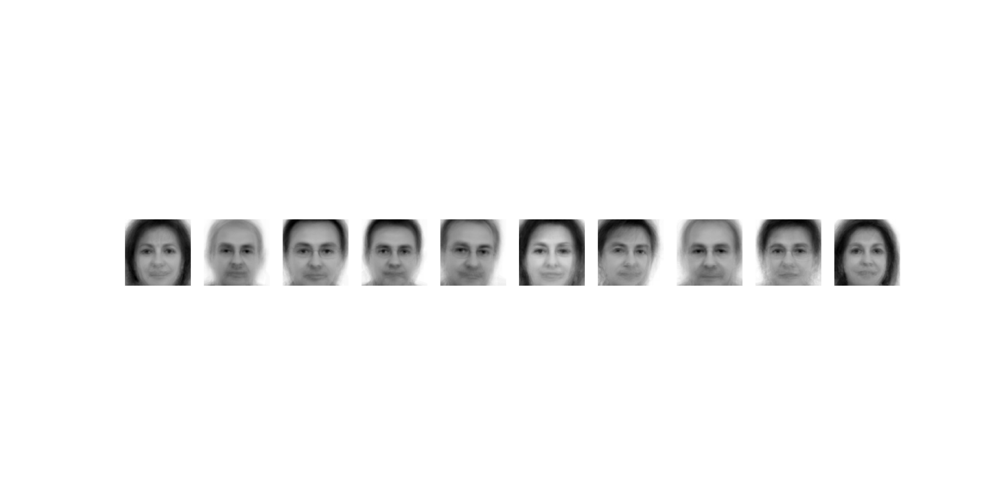

In [31]:
%matplotlib notebook
fig, axes = pl.subplots(1, 10, figsize=(30, 15))
for i in range(k):
    axes[i].imshow(centroids[i].reshape(86,85))
    axes[i].axis('off')
pl.show()

**Problem 6:** Fit a PCA model of the dataset.

We will fit a PCA model with two components, thus we will create a PCA with two prncipal components. After searching information about the PCA via [Principal components analysis](https://en.wikipedia.org/wiki/Principal_component_analysis), I have been able to understand (more or less, not in deep) how the PCA works. The two principal components that will be fitted are two unit vectors that constitute an orthonormal basis. It is, these two vectors are orthoginal and unitary. Then, these two vectors define a plane in this case. 

In [34]:
from sklearn.decomposition import PCA
pca_components = 2 # Choose the number of principal components
#We create an instance
pca = PCA(n_components=pca_components)
diputados_pca = pca.fit_transform(X)

**Problem 7:** Build a 2D score plot with the projections of the representatives onto the PCA plane. Generate two plots, one marking the gender label, a second one marking the political afiliation label,.

In the object `diputados_pca` we have for each photo the two respective components created fitting the PCA. Then, we can use the objects created in the guide `Yg` and `Yp` (where we have stored for each diputado the sex and the party) in order to do the scatterplot with labels. In the documentation of `matplotlib` one can find the necessary functions and commands for do the plote as we desire.

<IPython.core.display.Javascript object>


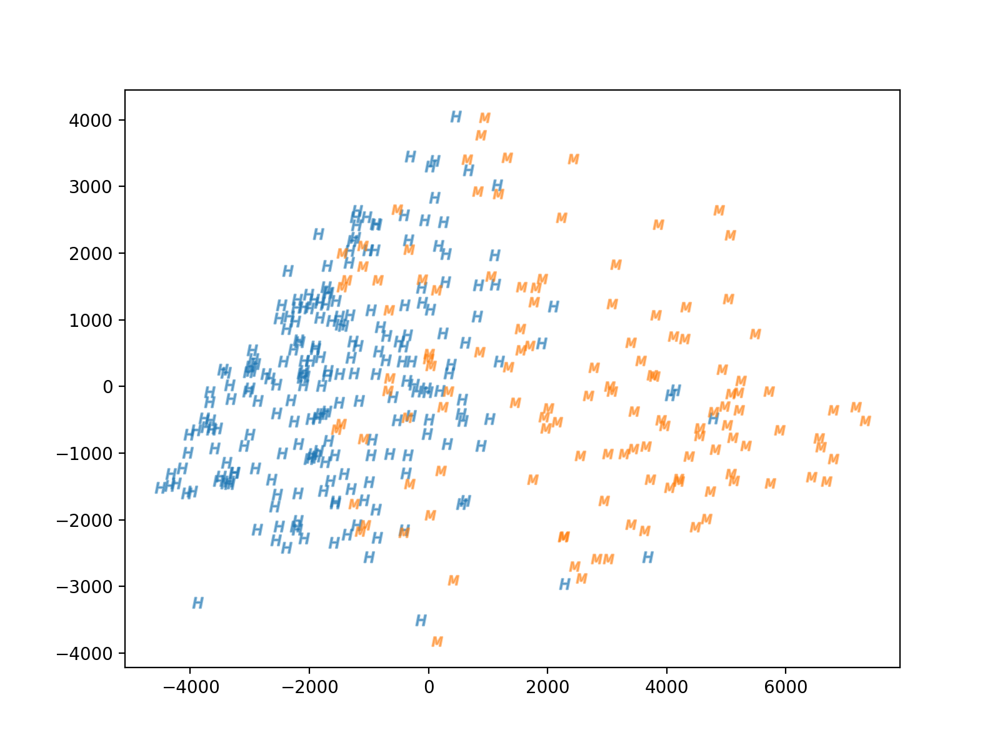

/var/folders/m9/9kj9ys9n1qx3zrnkvpntqp6r0000gn/T/ipykernel_1057/1910874745.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  pl.scatter(diputados_pca[Yg=='H', 0], diputados_pca[Yg=='H', 1], cmap='viridis', alpha=0.5, marker='$H$')
/var/folders/m9/9kj9ys9n1qx3zrnkvpntqp6r0000gn/T/ipykernel_1057/1910874745.py:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  pl.scatter(diputados_pca[Yg=='M', 0], diputados_pca[Yg=='M', 1], cmap='viridis', alpha=0.5, marker='$M$')


In [35]:
pl.figure(figsize=(8, 6))
#we plot first the images satisfying Yg=='H' (ie males)
pl.scatter(diputados_pca[Yg=='H', 0], diputados_pca[Yg=='H', 1], cmap='viridis', alpha=0.5, marker='$H$')
#now we plot images satisfiying Yg=='M' (ie mujeres=Femele)
pl.scatter(diputados_pca[Yg=='M', 0], diputados_pca[Yg=='M', 1], cmap='viridis', alpha=0.5, marker='$M$')

pl.show()

After search in the matplotlib documentation, and how to use dynamic markers with strings, I have managed to do the scatterplot using a for instruction.

<IPython.core.display.Javascript object>


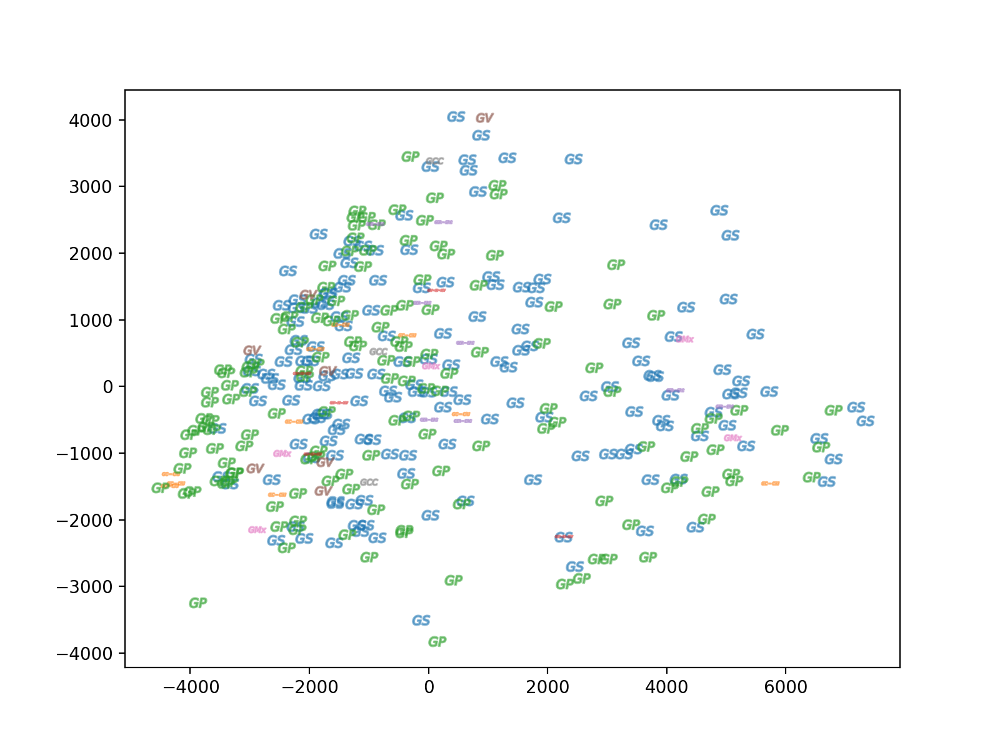

/var/folders/m9/9kj9ys9n1qx3zrnkvpntqp6r0000gn/T/ipykernel_1057/2656724650.py:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  pl.scatter(diputados_pca[Yp==i, 0], diputados_pca[Yp==i, 1], cmap='viridis', alpha=0.5, marker=dyn_mark,


In [36]:
#Now we proceed similar but with the different parties
pl.figure(figsize=(8, 6))
for i in df["Party"].unique():
    dyn_mark = "$" + str(i) + "$"
    pl.scatter(diputados_pca[Yp==i, 0], diputados_pca[Yp==i, 1], cmap='viridis', alpha=0.5, marker=dyn_mark, 
               s=100)

pl.show()

**Problem 8:** Plot the first three eigenvectors (principal components, PCs) projection vectors.

Notice that in the previous problems we have fitted a PCA with only two components. Clearly, we can not plot the first three eigenvalues with the actual PCA model fitted! Thus, we will fit another PCA model with three components. And then, we will plot the three eigenvalues. 

Once we have refitted the PCA model, using this time 3 components, we will use the `components_` attribute of the fitted model. We simpply plot the images provided by this attribute.

In [37]:
from sklearn.decomposition import PCA
pca_components_bis = 3 # Choose the number of principal components
#We create an instance
pca_bis = PCA(n_components=pca_components_bis)
diputados_pca_bis = pca_bis.fit_transform(X)

<IPython.core.display.Javascript object>


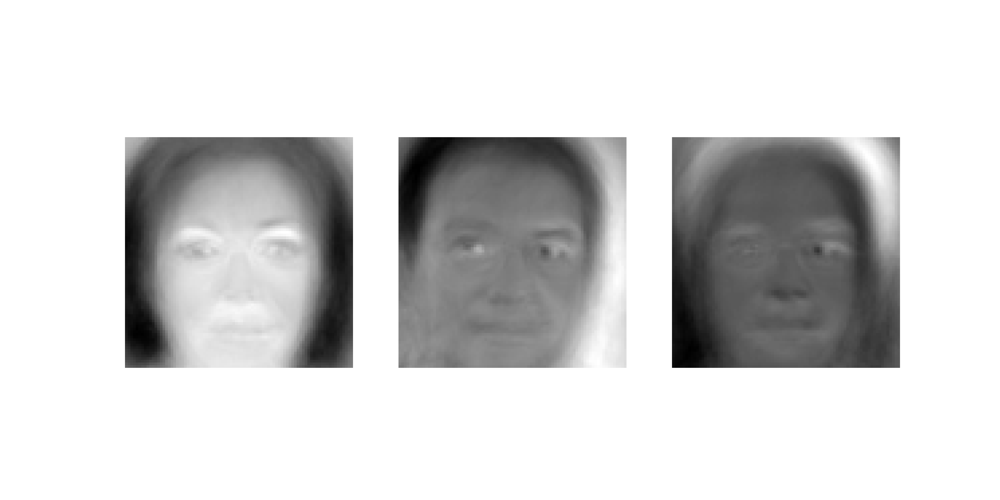

In [38]:
%matplotlib notebook
fig, axes = pl.subplots(1, 3, figsize=(30, 15))
for i in range(pca_components_bis):
    axes[i].imshow(pca_bis.components_[i].reshape(86,85))
    axes[i].axis('off')
pl.show()

**Problem 9:** Do you observe any instrumental variance (not due to the observed nature, but to the observation process)? 

In order to assess the intrumental variance we will plot the different clusters from the kmeans and we will asses (manualy) if there are some variance missexplained by the model because is caused by the observation process (for instance photos with more light, photos with more (or less) zoom than the normal, etc).

We start plotting the 10 clusters provided for the kmeans algorithm.

<IPython.core.display.Javascript object>


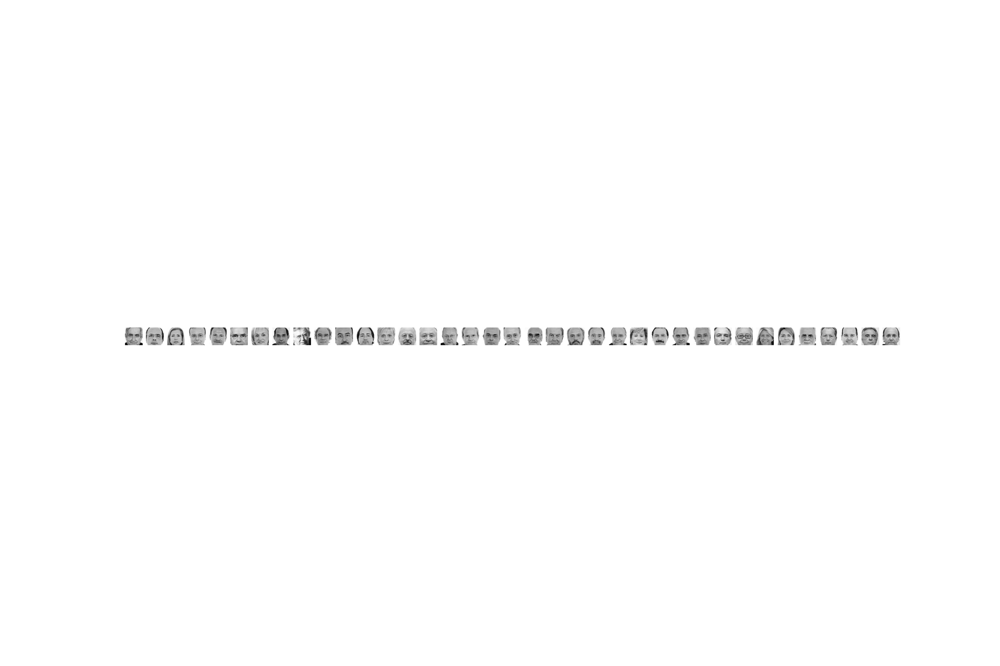

<IPython.core.display.Javascript object>


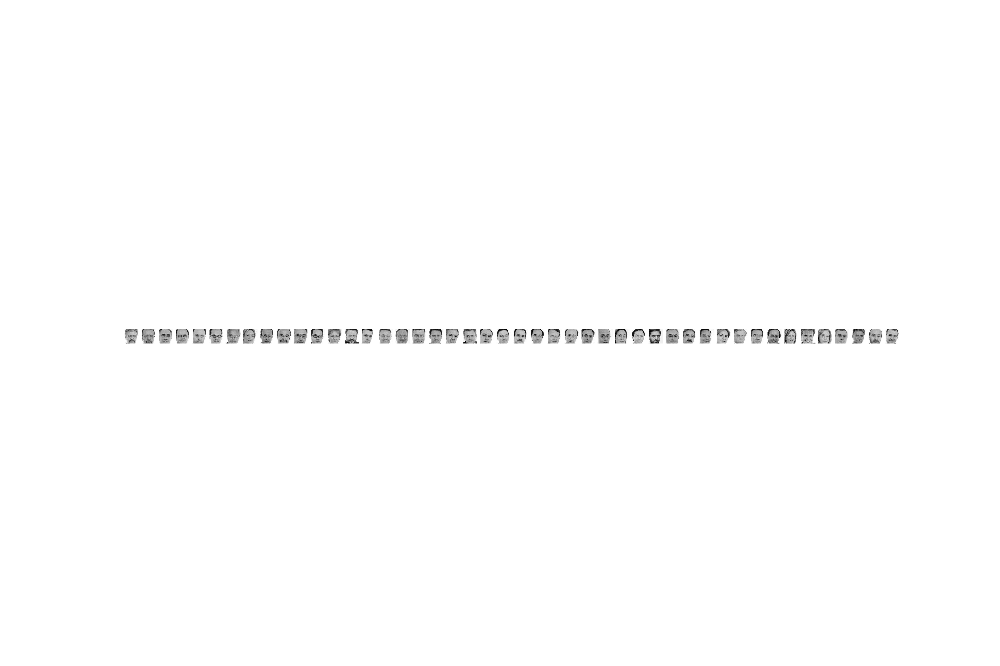

<IPython.core.display.Javascript object>


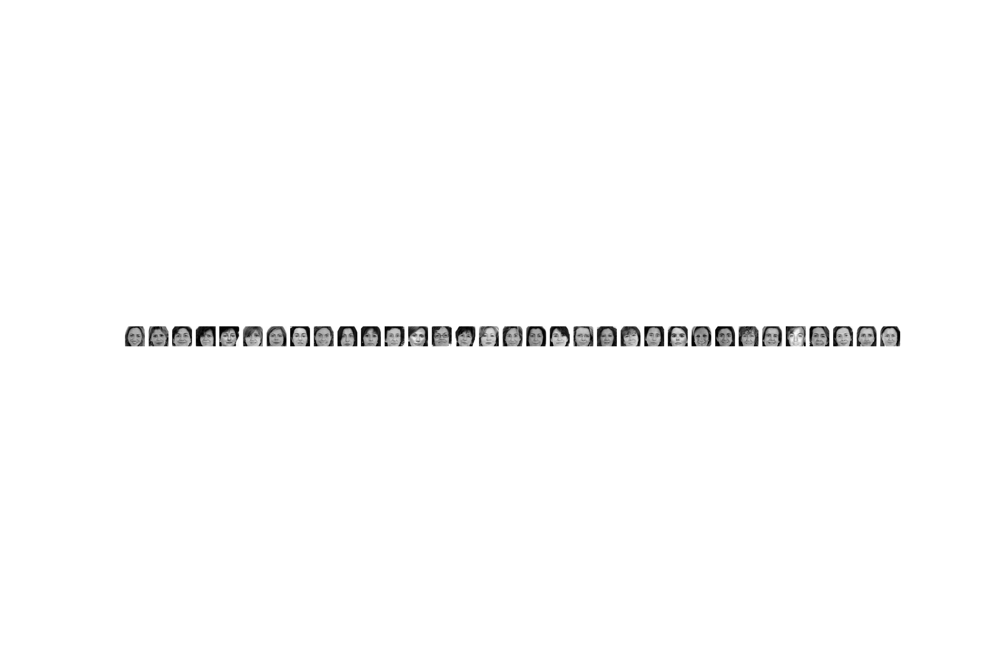

<IPython.core.display.Javascript object>


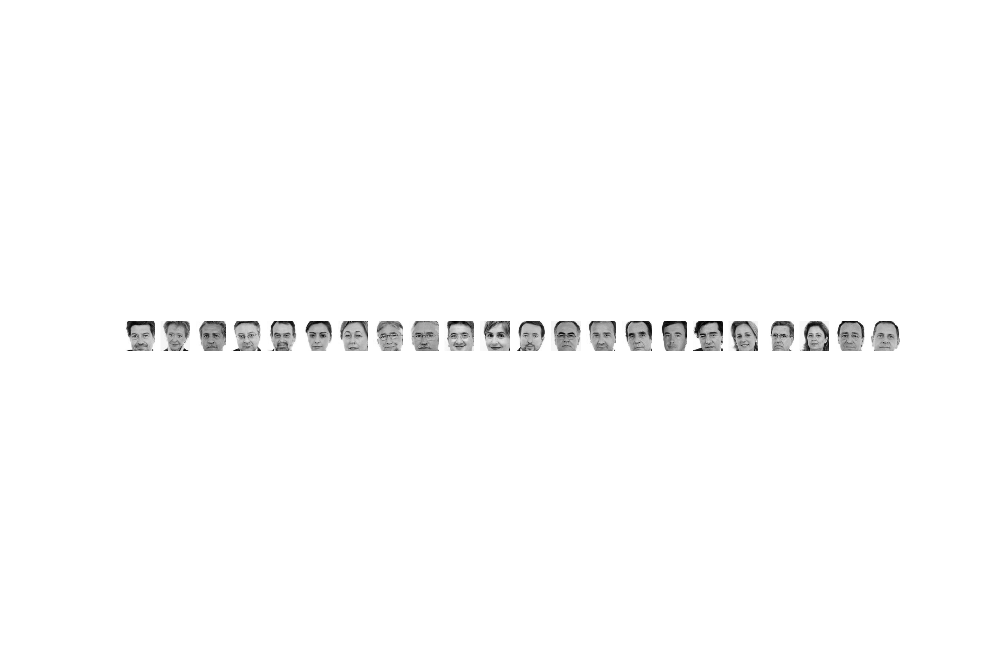

<IPython.core.display.Javascript object>


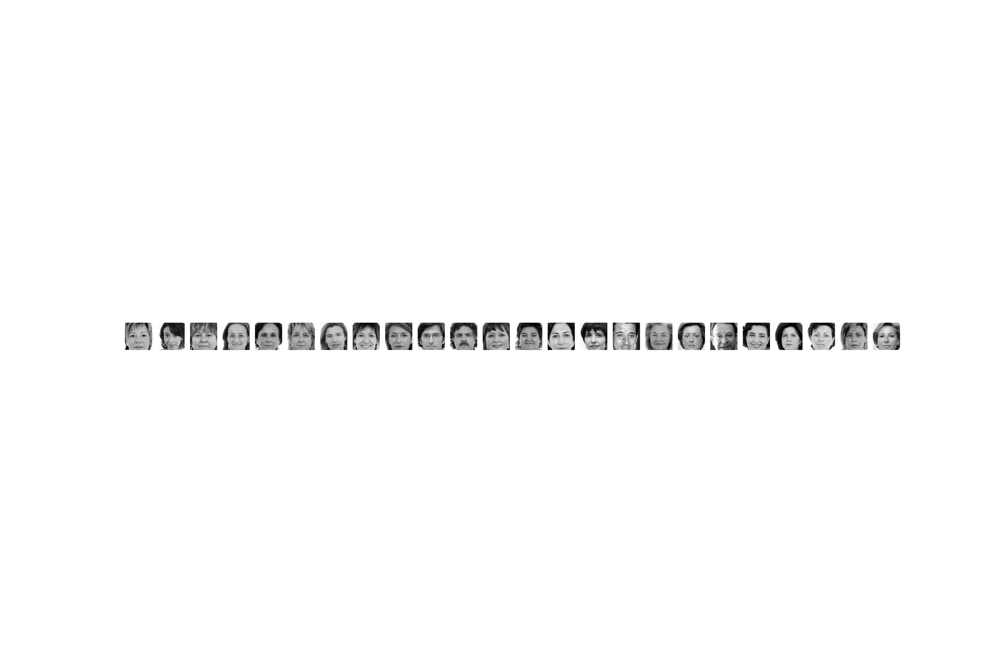

<IPython.core.display.Javascript object>


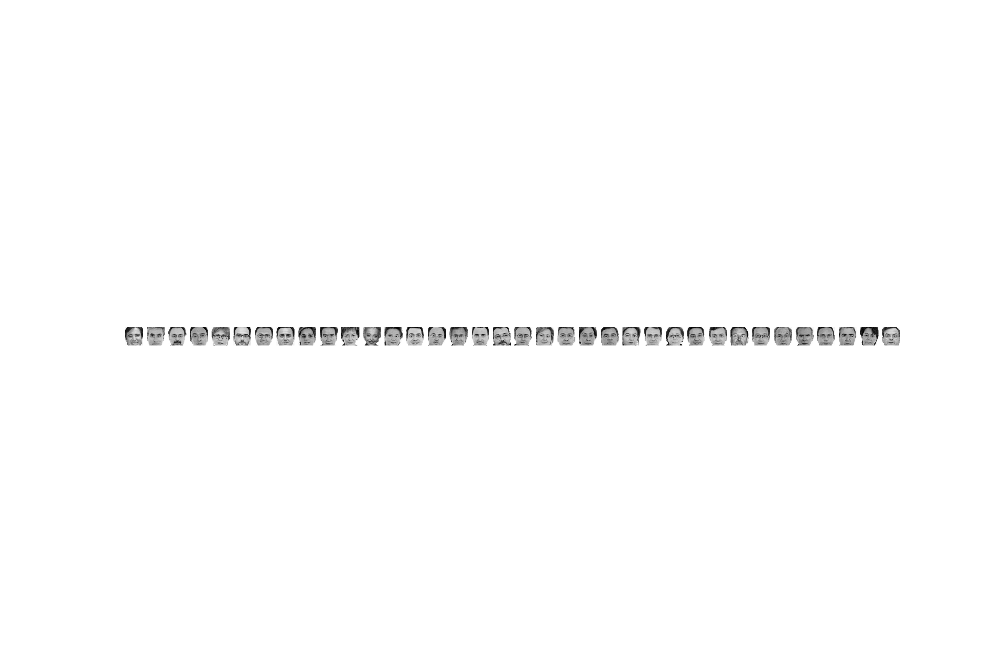

<IPython.core.display.Javascript object>


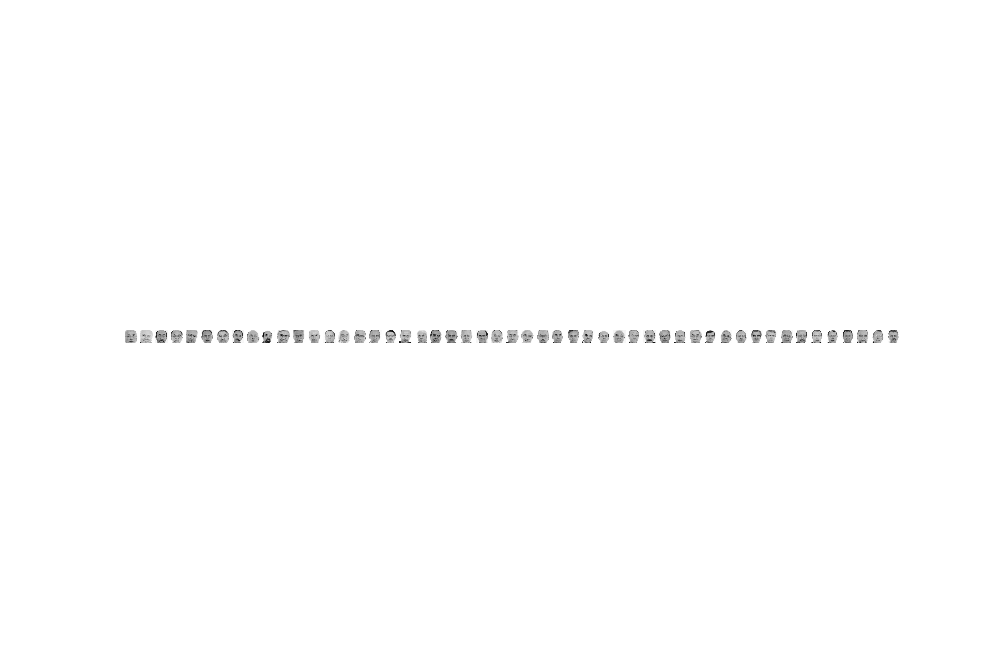

<IPython.core.display.Javascript object>


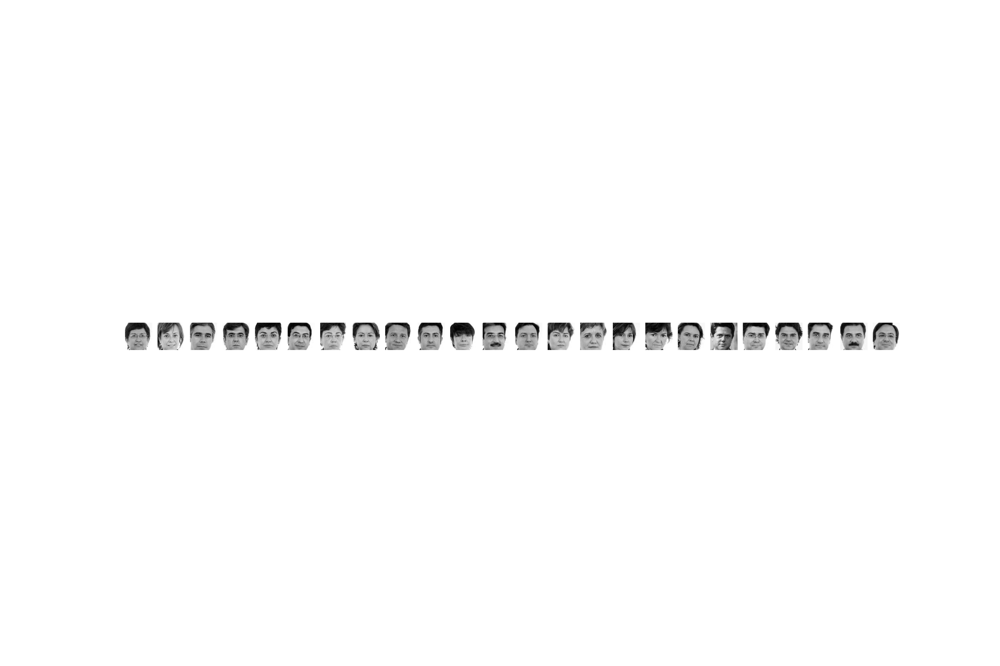

<IPython.core.display.Javascript object>


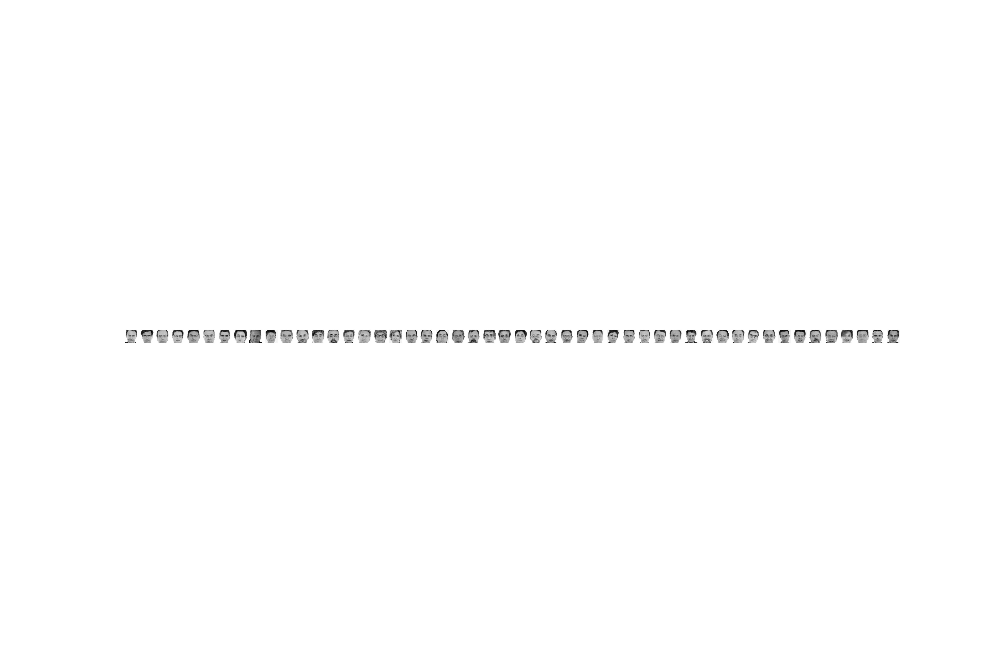

<IPython.core.display.Javascript object>


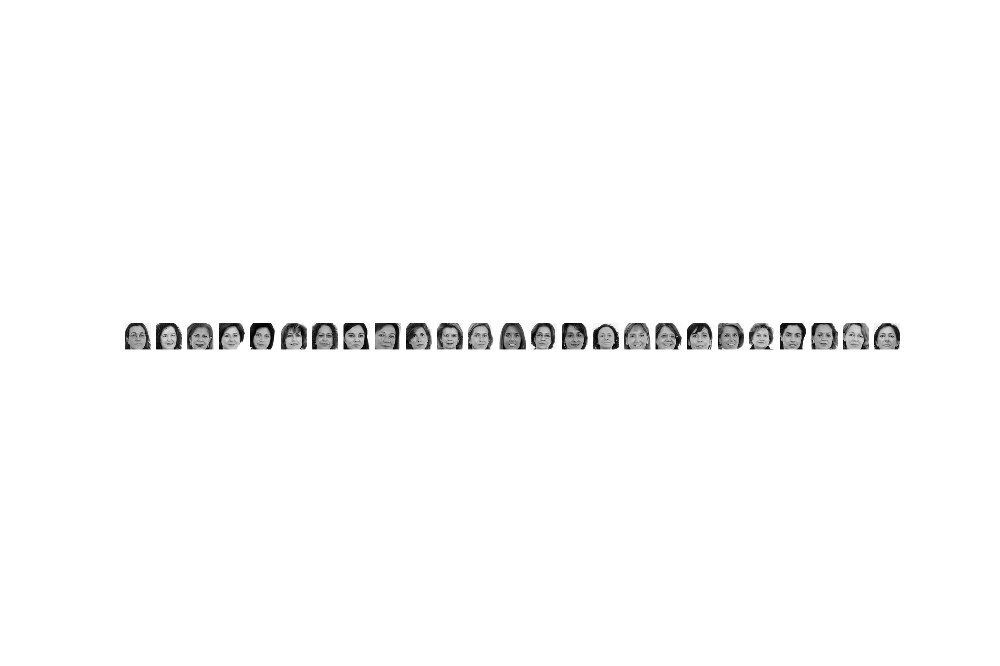

In [41]:
%matplotlib notebook
for i in range(k):
    indices_group = np.where(clusters == i)[0] 
    fig, axes = pl.subplots(1, len(indices_group), figsize=(30, 20))
    count=0
    for j in indices_group:
        axes[count].imshow(X[j].reshape(86,85))
        axes[count].axis('off')
        count=count+1
pl.show()

We can easily observe in these clusters different examples of instrumental variance. For example, in the cluster number $3$ (internally in python is `cluster==2`) we have a gruop formed by all females, except one photo which corresponds to a male diputado. The model, probably join these photos in the same cluster because of the hair of the females, that cause dark edges in the photo. In the case of the male diputado added in this group, the background of the photo is black! This dark background has "confused" the model. This is a clear example of instrumental variance. In the cluster $5$ we have a very similar case than the explained now, with a male diputado added because of the black background in the photo.

In the first cluster we have a set of photos that all are taken with more zoom than the normal. Because of this, the dark part in the edges provided by the hair of the diputados has less effect. And then, the model is not able to distinguish between bald male diputados, male diputados whose photos were taken with more zoom than the normal, or female diputados with light color of hair or female diputados whose photos were taken with more light than the normal. Thus, this is also a good example of instrumental variance.




**Problem 10:** Plot the amount of variance explained by each PCs.

For plot the amount of variance explained by the PCA components we will use the `explained_variance_` attribute of the PCA fitted model. According to the sklearn documentation: The `explained_variance_` attribute provides the amount of variance explained by each of the selected components. The variance estimation uses `n_samples - 1` degrees of freedom. In addition, we will be using `np.cumsum()` in order to compute the cumulative sum. Notice that we will use `explained_variance_ratio` because it returns the percentage of variance explained by each of the selected components. And with this is easier to do the plot and well interpret the results.

<IPython.core.display.Javascript object>


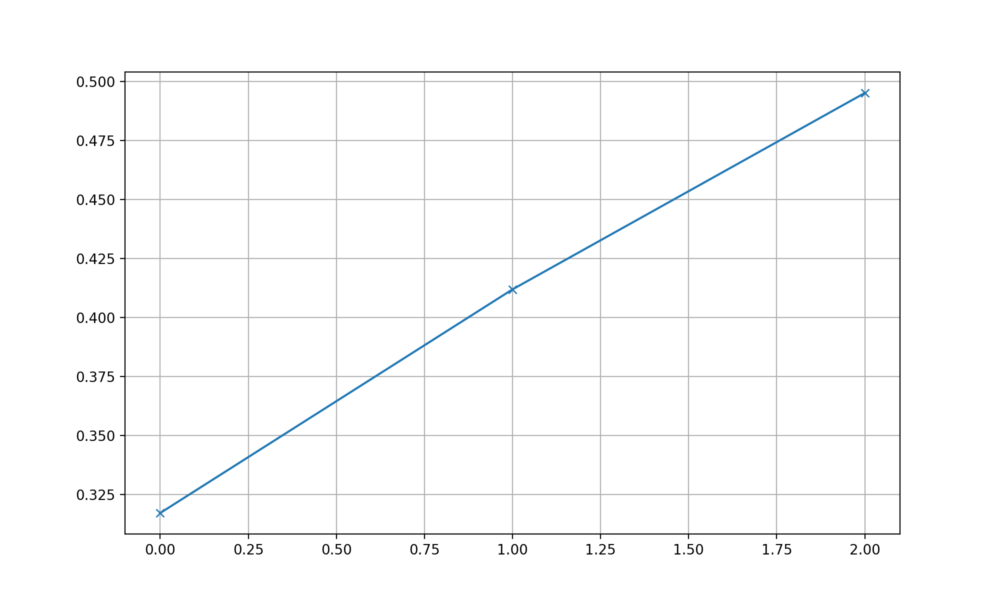

In [40]:
pl.figure(figsize=(10, 6))
pl.plot(np.cumsum(pca_bis.explained_variance_ratio_), marker='x')
pl.grid(True)
pl.show()

Now we will print the explained variance for each component, and the explained variance in ratio. We can observe that the first PCA component explain more variance than the second, and that the second explain more than the third component. In general, in the PCA models the first components explains more variance than de following components. It is, if $v_i$ is the variance explained for the $ith$ PCA component and we have $n$ components, then $v_1<v_2<\dots<v_n$.

In [41]:
print(pca_bis.explained_variance_,pca_bis.explained_variance_ratio_) 

[7401568.0752166  2213610.64775447 1944151.98228851] [0.31707754 0.09482939 0.08328599]


**Problem 11:** Train a gender predictor with the class of representatives. Which performance can you get on predicting gender from the images? Provide metrics.

We will train a predictor using `RandomForestClassifier` from `sklearn.ensemble`. We will split the data into training and test sets, for this we will use `train_test_split` from `sklearn.model_selection`. Then, as the names indicates, we will train our model with the train set, and we will test the trained model with the test set. Notice that we will apply the Random Forest Classifier directly to the images stacked in `X`.

In the documentation of `sklearn.model_selection.train_test_split` we have explained the parameters to be passed. We will put the $80$% of the data in the train set, and then the $20$% remaining in the test set. We will use `random_state=40`, which controls the shuffling applied to the data before applying the split. Pass an int for reproducible output across multiple function calls. This is, this parameter is for reproducibility of the model. 

In addition, we will use `accuracy_score` from `sklearn.metrics` in order to assess the accuracy of our predictions and provide the metrics demanded.

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Split the data, train_size=0.8 means that the 80% of the data will be saved in train set
#similarly test_size=0.2
X_train, X_test, yg_train, yg_test = train_test_split(X, Yg, train_size=0.8, test_size=0.2, random_state=40)

# Using Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=40)

# We train the data in the train set with the fitted model
rf_classifier.fit(X_train, yg_train)

# We make predictions using the trained model and the test set
yg_pred = rf_classifier.predict(X_test)

# We assess the accuracy of the predictions
accuracy = accuracy_score(yg_test, yg_pred)
print("Accuracy of the predictons:", accuracy)

Accuracy of the predictons: 0.8857142857142857


We will try to understand how good the predictions are comparing manually the gender predictions vs the gender saved in the test set:

In [43]:
print(yg_test,yg_pred)

['H' 'H' 'H' 'H' 'H' 'H' 'H' 'H' 'M' 'H' 'H' 'M' 'H' 'H' 'H' 'H' 'H' 'H'
 'H' 'H' 'H' 'H' 'H' 'H' 'H' 'H' 'M' 'H' 'M' 'M' 'H' 'M' 'H' 'H' 'H' 'H'
 'H' 'M' 'M' 'H' 'H' 'H' 'H' 'H' 'M' 'M' 'M' 'H' 'M' 'H' 'M' 'H' 'H' 'H'
 'H' 'H' 'H' 'H' 'M' 'H' 'M' 'H' 'H' 'H' 'H' 'H' 'M' 'H' 'M' 'H'] ['H' 'H' 'H' 'H' 'H' 'H' 'H' 'H' 'M' 'H' 'H' 'M' 'H' 'H' 'H' 'H' 'H' 'H'
 'H' 'H' 'H' 'H' 'H' 'H' 'H' 'M' 'M' 'H' 'M' 'M' 'H' 'M' 'H' 'M' 'H' 'H'
 'H' 'M' 'M' 'H' 'H' 'H' 'H' 'H' 'M' 'M' 'H' 'M' 'M' 'H' 'M' 'H' 'H' 'M'
 'H' 'H' 'M' 'H' 'M' 'H' 'M' 'H' 'H' 'H' 'H' 'H' 'M' 'M' 'H' 'H']


In [44]:
sum(yg_test==yg_pred)/len(yg_test)

0.8857142857142857

Indeed, if we compute the proportion of thr well-done predictions we obtain the accuracy shown before.

**Problem 12:** Do the same with the label containing political party of the representatives. Discuss the results. 

Here we proceed very similar than in the previous problem but using the object `Yp`, where we have the labels of the parties of the diputados.

In [45]:
# Split the data, train_size=0.8 means that the 80% of the data will be saved in train set
#similarly test_size=0.2
X_train, X_test, yp_train, yp_test = train_test_split(X, Yp, train_size=0.8, test_size=0.2, random_state=41)

# Using Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=41)

# We train the data in the train set with the fitted model
rf_classifier.fit(X_train, yp_train)

# We make predictions using the trained model and the test set
yp_pred = rf_classifier.predict(X_test)

# We assess the accuracy of the predictions
accuracy = accuracy_score(yp_test, yp_pred)
print("Accuracy of the predictions:", accuracy)

Accuracy of the predictions: 0.5571428571428572


Discuss the results: Heuristically, it is obvius that the predictions ins this case should be worst. Predict the political party using images is harder than predict the gender. The gender is an attribute that, in general terms, is more easy to classify based on physical characteristics (for instance, long hair, moustache, short heair, no hair, etc.). 

On the other hand, predict the party with respect images seems more complex. Notwithstanding, the accuracy of the predictions for the parties, is in my opinion, around of $56$% of the data is well-predicted for the model! In addition is important to comment that the majority of diputados are from two parties: 

In [46]:
df["Party"].value_counts()

GS            164
GP            146
GC-CiU         10
GER-ERC         8
GV              7
GIV-IU-ICV      5
GMx             5
GCC             3
Name: Party, dtype: int64

As we can see in the metadata, $(164/348)*100=47.1$% of the diputados are part of the GS party and $(146/348)*100=41$% are part of the GP party. Then, if we have a model that predict: all the diputados are from GS. The accuracy will be of $47.1$%. This suggests that maybe, the model for predict parties is not so good. 

### Bonus questions:
**Problem 13:** With the PCA model, being $e_1$ and $e_2$ the fist and second eigenvector and $\mu$ the mean image, reconstruct a synthetic  image generated on the PCA plane $I=\mu+Ae_1+Be_2$ where A and B are two scalars. Build an interactive plot that generates the reconstructed image from A and B through two sliders.

For this problem we will use `interact` and `widgets` from `ipywidgets`. A funny package for create interactive objects in python that we saw during the lectures of the course. We will define a function that given the scalars $a,b$ plot the desired image, and then we will use `ipywidgets` for build the interactive plot. In addition, we will use `mean_diputado` and `pca`, which are objects created in the previous problems.

In [49]:
%matplotlib notebook
from ipywidgets import interact, widgets 
def plot_synimage(a,b):
    pl.imshow(mean_diputado.reshape(86,85) + a*pca.components_[0].reshape(86,85) + b*pca.components_[1].reshape(86,85))
    
    
slider_a = widgets.FloatSlider(value=0, min=-20, max=20, step=0.5, description='Scalar a:')
slider_b = widgets.FloatSlider(value=0, min=-20, max=20, step=0.5, description='Scalar b:')

# Create interactive plot
interact(plot_synimage, a=slider_a, b=slider_b);

interactive(children=(FloatSlider(value=0.0, description='Scalar a:', max=20.0, min=-20.0, step=0.5), FloatSli…

**Problem 14:** Use PCA as a compression algorithm. Check the effect of the compression with the number of PCs. Is the method useful also in cross validation? 

In this problem we will use that PCA reduces the dimension of the data, and using this reduced dimension as a compression of the original data. What we will do is apply the PCA, as we did before in other problems, and then we will reconstruct the data using the compressed data. We will se how are the images obtained by this method, and also we will change the number of principal components with the aim of see how affects the number of principal components in the quality of the compressed data and then in the reconstructed images.

Taking a look into the `sklearn.decompsotion` documentation in [https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html], we can see that there is a method called `inverse_transform()` which "Transform data back to its original space". Then, what we will do is fit a PCA model, exactly as we did in the previous problems, and then use this method for recover the data in the original shape. Let's see it!

In [51]:
pca_comp = 3 #the number of principal components
#We create an instance
pca_bonus = PCA(n_components=pca_comp)
diputados_pca_bonus = pca_bonus.fit_transform(X) #here we fit PCA
#now we recover the data in the original shape form pca model
diputados_recovered = pca_bonus.inverse_transform(diputados_pca_bonus) 

<IPython.core.display.Javascript object>


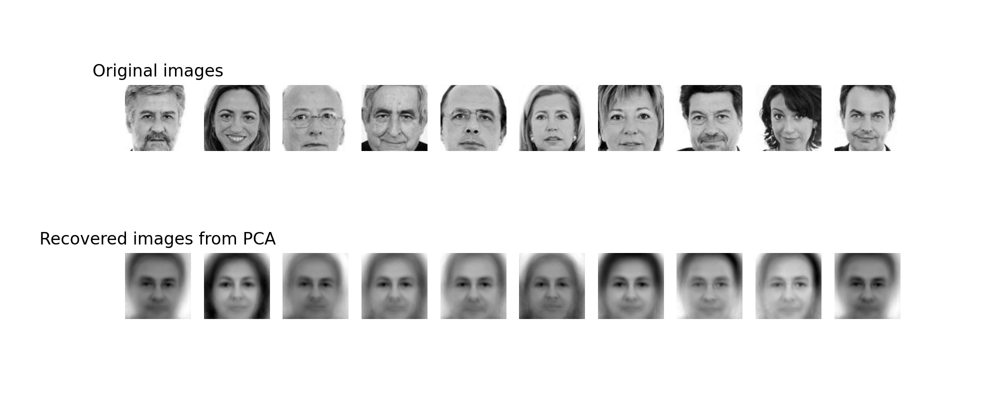

In [54]:
#we will plot and compare 10 images:
fig, axes = pl.subplots(2, 10, figsize=(10, 4))

for i in range(10):
    # Original image
    axes[0, i].imshow(X[i].reshape(86, 85))
    axes[0, i].axis('off')
    if(i==0):
        axes[0, i].set_title('Original images')

    # Reconstructed image
    axes[1, i].imshow(diputados_recovered[i].reshape(86,85))
    axes[1, i].axis('off')
    if(i==0):
        axes[1, i].set_title('Recovered images from PCA')

pl.show()

Now we will repeat exactly the same but using more components in the PCA model:

In [55]:
pca_comp = 10 #the number of principal components
#We create an instance
pca_bonus = PCA(n_components=pca_comp)
diputados_pca_bonus = pca_bonus.fit_transform(X) #here we fit PCA
#now we recover the data in the original shape form pca model
diputados_recovered = pca_bonus.inverse_transform(diputados_pca_bonus) 

<IPython.core.display.Javascript object>


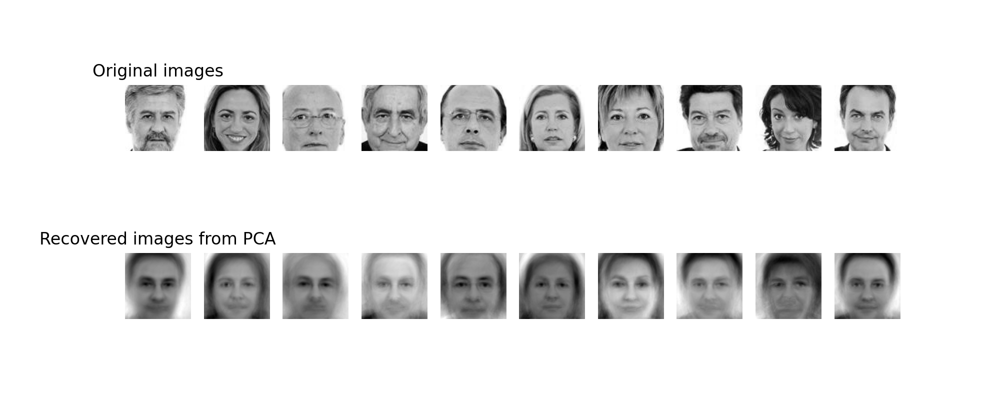

In [56]:
#we will plot and compare 10 images:
fig, axes = pl.subplots(2, 10, figsize=(10, 4))

for i in range(10):
    # Original image
    axes[0, i].imshow(X[i].reshape(86, 85))
    axes[0, i].axis('off')
    if(i==0):
        axes[0, i].set_title('Original images')

    # Reconstructed image
    axes[1, i].imshow(diputados_recovered[i].reshape(86,85))
    axes[1, i].axis('off')
    if(i==0):
        axes[1, i].set_title('Recovered images from PCA')

pl.show()

We can observe that the recovered images from the compression data in PCA model is more similar than the original data if we use more principal comoponents! We will repeat this again using more principal components.

In [57]:
pca_comp = 100 #the number of principal components
#We create an instance
pca_bonus = PCA(n_components=pca_comp)
diputados_pca_bonus = pca_bonus.fit_transform(X) #here we fit PCA
#now we recover the data in the original shape form pca model
diputados_recovered = pca_bonus.inverse_transform(diputados_pca_bonus) 

<IPython.core.display.Javascript object>


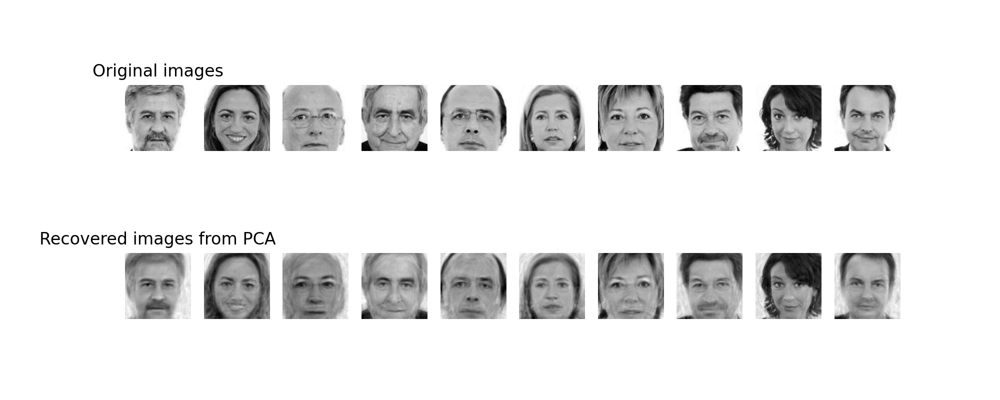

In [58]:
#we will plot and compare 10 images:
fig, axes = pl.subplots(2, 10, figsize=(10, 4))

for i in range(10):
    # Original image
    axes[0, i].imshow(X[i].reshape(86, 85))
    axes[0, i].axis('off')
    if(i==0):
        axes[0, i].set_title('Original images')

    # Reconstructed image
    axes[1, i].imshow(diputados_recovered[i].reshape(86,85))
    axes[1, i].axis('off')
    if(i==0):
        axes[1, i].set_title('Recovered images from PCA')

pl.show()

Indeed, using now $100$ principal components the recovered images obtained are much more similar to the original images. 

Now, we discuss if this method is useful in cross-validation. In cross-validation we split the data into different subsets, we train our model with some of these subsets and we test our model with the remaining subsets. Thus, I think that using PCA as a compression algorithm should be useful for this. Using PCA we can have the original data saved using less dimension, it is, we can have the information of the original data summarised. As we see right now, using properly the number of principal components, when we recover the original data from the summary in PCA the results are good. And so, PCA can summarise pretty good the original data, without loosing too much information. Because of this, I think that we can develop cross validation with the summarised data provided by PCA and obtain good results. Clearly, apply cross validation with the data provided for the PCA model is computationally less expensive than apply cross validation directly with the original data, and then it is an interesting approach.

**Final comments:** 

I really enjoyed carrying out this deliverable. I learned a lot about machine learning and about methods like kmeans or PCA, which I had never seen before doing this work. I have also been surprised how easy it is to use these methods in python and the flexibility that python offers to be able to use this kind of algorithms with different types of data.  It is really amazing how conceptually simple methods like kmeans work so well and are really useful in practice. I also found PCA really interesting because of the mathematics behind it, it's a really nice idea. 

The only thing I missed was in some statements a little more explanation or guidance. In several moments of the work I found myself using things that I didn't really understand what they were. However, thanks to the help of the internet and colleagues, who had a previous knowledge of the concepts used in the work, I have been able to understand quite well all the concepts that I have used during the work. 
